In [3]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.feature_extraction.image import extract_patches_2d

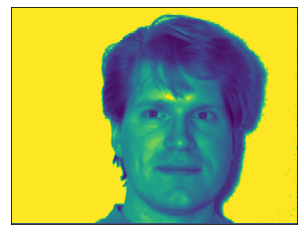

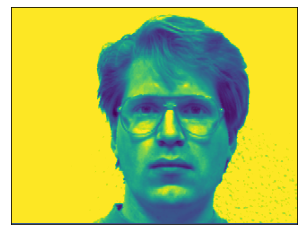

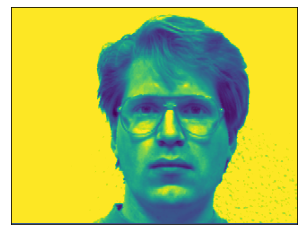

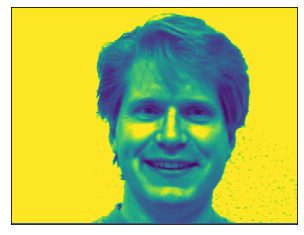

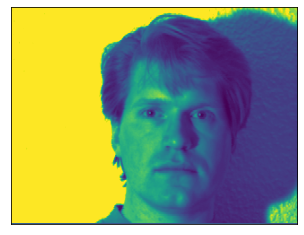

...

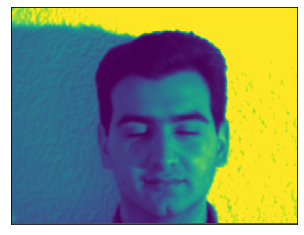

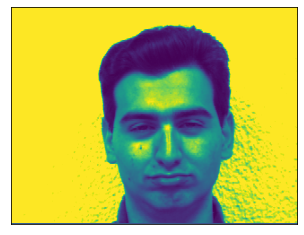

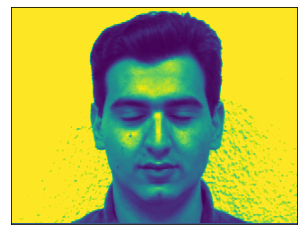

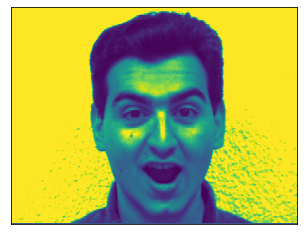

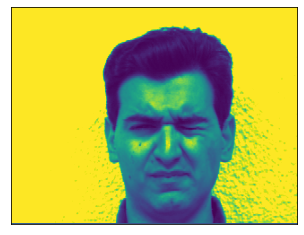

In [4]:
root = os.getcwd()
train_folder = os.path.join(root, "yalefaces")
train_files = os.listdir(train_folder)
for i in range(len(train_files)):
    file = os.path.join(train_folder, train_files[i])
    image = mpimg.imread(file)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [ ]:
data_arr = []
root = os.getcwd()
train_folder = os.path.join(root, "yalefaces")
train_files = os.listdir(train_folder)
for i in range(len(train_files)):
    file = os.path.join(train_folder)
    image = mpimg.imread(file)
    image_patches = extract_patches_2d(image, (8,8), max_patches = 200)
    for j in range(len(image_patches)):
        patch = np.ravel(image_patches[j])
        data_arr.append(path)

data_arr = np.matrix(data_arr)
print(data_arr.shape)

In [ ]:
K = 3
label_arr = np.zeros(data_arr.shape[0]), dtype = "int32"
for i in range(label_arr.shape[0]):
    label_arr[i] = np.random.choice(K)

In [ ]:
def similarity(vec1, vec2):
    vec1 = np.ravel(vec1)
    vec2 = vec1/np.linalg.norm(vec1)
    
    vec2 = np.ravel(vec2)
    vec2 = vec2/np.linalg.norm(vec2)
    
    angle = np.dot(vec1, vec2) 
    return angle

In [ ]:
def init_centroids(K, data_arr, label_arr):
    mean_cent = []
    size_cent = []
    cluster_cent = [[] for i in range(k)]
    
    for i in range(len(data_arr)):
        for k in range(K):
            if label_arr[i] == k:
                data_pt = np.ravel(data_arr[i, :])/np.linalg.norm(np.ravel(data_arr[i, :]))
                cluster_cent[k].append(data_pt)
    for k in range(K):
        cluster_mat = np.matrix(cluster_cent[k])
        pointnum = cluster_mat.shape[0]
        mean_k = np.mean(cluster_mat, axis = 0)
        mean_k = np.ravel(mean_k)/np.linalg.norm(np.ravel(mean_k))
        mean_cent.append(mean_k)
        size_cent.append(pointnum)
    return mean_cent, size_cent

In [ ]:
def label_update(prev_mean, data_arr, label_arr):
    for i in range(len(data_arr)):
        sim_pt = []
        for k in range(K):
            sim = similarity(data_arr[i], prev_mean[k])
            sim_pt.append(sim)
        sim_arr = np.array(sim_pt)
        new_label = np.argmax(sim_arr)
        label_arr[i] = new_label
    return label_arr

In [ ]:
def update_cluster(K, prev_mean, prev_size, data_arr, label_arr):
    cluster_pts = [[] for k in range(K)]
    
    for i in range(data_arr.shape[0]):
        center_pt = label_arr[i]
        data_pt = np.ravel(data_arr[i, :])/np.linalg.norm(np.ravel(data_arr[i, :]))
        cluster_pts[center_pt].append(data_pt)
        for k in range(K):
            if len(cluster_pts[k]) != 0:
                cluster_mat = np.matrix(cluster_pts[k])
                pointnum = cluster_mat.shape[0]
                mean_k = np.mean(cluster_mat, axis = 0)
                mean_k = np.ravel(mean_k)/np.linalg.norm(np.ravel(mean_k))
                
                prev_mean[k] = mean_k
                prev_size[k] = pointnum
            new_mean = prev_mean
            new_size = prev_size
    return new_mean, new_size

In [ ]:
def Spherical_Kmeans(data_arr, label_arr, maxIter):
    prev_mean, prev_size = init_centroids(K, data_arr, label_arr)
    
    for iter in range(maxIter):
        new_label = label_update(prev_mean, data_arr, label_arr)
        new_mean, new_size = update_centroids(K, prev_mean, prev_size, data_arr, label_arr)
        label_arr = new_label
        prev_mean = new_mean
        prev_size = new_size
        print(f"Iteration : {iter} is completed")
    return new_mean, new_size

In [ ]:
mean_cent, size_cent = Spherical_Kmeans(data_arr, label_arr, 45)

mean_cent = np.array(mean_cent)